In [1]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

# Report - Data Science in Energy, Emissions and GDP Forecast

#### Student Name : Joyce Jin  ; Student ID: 23004724
#### Student Name : Luke Beck  ; Student ID: 22011114
#### Student Name : Luis Vieira  ; Student ID: 23012096
---

## Executive Summary  <a name="executive-summary"></a>

This project employs advanced data science techniques to predict energy consumption, emissions and GDP. <br>
 - **First part of predicting emission:**<br>
Three models were evaluated: polynomial regression, ARIMA, and SARIMAX. The ARIMA model was identified as the best performer based on its lower root mean square error (RMSE) compared to the other models.<br>
For the ARIMA and SARIMAX models, an optimal order selection process was conducted. The optimal order for each model was determined by assessing different combinations of autoregressive (AR), differencing (D), and moving average (MA) orders, as well as seasonal orders. The goal was to find the order configuration that yielded the best fit to the data.<br>
In conclusion, the ARIMA model with the optimal order demonstrated superior predictive performance in estimating the "cumulative_luc_co2" variable. These findings provide valuable insights for decision-making related to climate change mitigation and sustainable development efforts.
 - **Renewable Energy Share forecast:**<br>
ARIMA model was chosen to predict the Share of Renewable Energy for the largest economies based on GDP plus New Zealand, after comparing it to LSTM and Neural Net models.
 - **Prediction of GDP based on Energy Usage for any Country:**<br>
It was quickly found that while there is a relationship between energy usage and GDP, this relationship is unique to each country.  A linear model was used to show that the general overall relationship between energy usage and GDP is positive for countries that are emerging from poverty.  Conversely, some rich countries have managed to increase their GDP while decreasing their energy usage.  This means that rich countries should be able to decrease their energy usage without affecting their GDP, while, in poor countries, increasing energy usage increases GDP.  This is important as it provides a strategy for increasing the GDP of poor countries, which is arguably the most important goal of the sustainable development efforts.

## Table of contents
1. [Introduction](#introduction)
2. [Research Questions](#research-questions)
3. [Task 1 Data preparation:](#task-1)
    - [3.1 Project datasets load](#project-1)
4. [Task 2 EDA](#eda)
    - [4.1 EDA for CO2](#eda_co2)
    - [4.2 EDA for Energy](#eda_energy)
    - [4.3 EDA for CO2 & Energy Merged](#eda_merge)
5. [Task 3 Model development and evaluation:](#task-3)
    - [5.1 Predict the Future cumulative_luc_co2](#regression)
    - [5.2 Forecasting the Share of Renewable Energy](#time-series)
    - [5.3 Prediction of GDP based on Energy Usage](#Regression)
6. [Conclusion](#model-summary)


## 1. Introduction <a name="introduction"></a>

The purpose of this project is to implement the entire data science/analytics workflow and create a data science-related software product based on a chosen real-world problem domain/dataset which generates insights.<br>
This study focuses on the CO₂ and energy for global warming, while also exploring GDP and energy usage for decreasing poverty in poor nations.<br>

Greenhouse gases, particularly carbon dioxide (CO₂), are major contributors to global warming as they trap heat in the Earth's atmosphere. This results in a steady increase in the Earth's average temperature and triggers severe climate effects. Human activities, such as burning fossil fuels and altering land use, have led to a significant rise in CO₂ levels. One crucial aspect in understanding global warming is the role of land-use changes, specifically the cumulative CO₂ emissions associated with activities like deforestation and urbanization. These emissions intensify the greenhouse effect, driving the Earth's temperature even higher. Over time, the consequences of global warming become more evident, including more frequent and intense weather events, ocean acidification, and habitat loss. To address these challenges, it is crucial to prioritize the promotion of renewable energy sources and sustainable land-use practices. By doing so, we can effectively reduce CO₂ emissions and mitigate the far-reaching impacts of climate change.<br>
The first part is perform prediction of the "cumulative_luc_co2" represents CO₂ emissions from land-use changes.
<br>
<br>
In regards with the energy sector, it currently accounts for about 75% of global greenhouse gas emissions. The energy sector stands on the brink of a necessary transformation, moving away from a heavy reliance on fossil fuels towards the integration of renewable, environmentally friendly energy sources. This shift is particularly critical for the world's 10 largest economies, responsible for about half of global emissions, as they need to progressively increase their renewable energy utilization and transition away from fossil fuels. This transformation is an essential strategy in the fight against global warming and in achieving the United Nations Sustainable Development Goals (UN SDGs) goal of carbon neutrality by 2050. By leading this shift towards renewable energy, these powerful economies can not only significantly reduce greenhouse gas emissions, but also pave the way for a sustainable, low-carbon future.
<br>
<br>
All around the world, powerful organizations, rich countries and their people are calling for net zero carbon emissions.  It is possible that rich first world countries, with more robust economies, could make the transfer from fossil fuel power plants to renewable energy sources.  But in a lot of poor countries, where many people are too poor to think about anything more than the utilitarian pursuit of survival, few people have any sort of power at all.  This is because these countries are struggling to develop the infrastructure that would allow them to convert even fossil fuels into usable energy.  And if they can't convert fossil fuels into energy, there is no way that they will be able to power a thriving country from renewable sources.  Rich countries haven't even done that successfully yet!  This project will explore how increasing energy use increases the GDP of a country and therefore the quality of living of its people.

## 2. Research Questions <a name="research-questions"></a>
1. Greenhouse gases play a crucial role in global warming due to their ability to trap heat within the Earth's atmosphere. Given the significant role of greenhouse co2 in global warming, how effectively can we predict its future values based on past trends and patterns?
2. Considering what in dataset is the main contributor to greenhouse gas emissions, what kind of model we could build upon?
3. How is GDP affected by energy usage and what does this mean for decreasing poverty in poor countries.
5. Assess if the largest economies in the World are showing a shift towards renewable energy.
6. Are we likely to achieve the net zero goal by 2050?


#### Dataset Souce: 
- https://github.com/owid/co2-data <br>
- https://github.com/owid/energy-data<br>
All visualizations, data, and code produced by Our World in Data are completely open access under the Creative Commons BY license. You have the permission to use, distribute, and reproduce these in any medium, provided the source and authors are credited.

The data produced by third parties and made available by Our World in Data is subject to the license terms from the original third-party authors. We will always indicate the original source of the data in our database, and you should always check the license of any such third-party data before use.

#### Dataset Metadata:
owid-co2-codebook.csv    on https://github.com/owid/co2-data/blob/master/owid-co2-codebook.csv  <br>
owid-energy-codebook.csv on https://github.com/owid/energy-data/blob/master/owid-energy-codebook.csv

---

## 3. Task 1: Data preparation <a name="task-1"></a>




In [2]:
# Import libraries
import pandas as pd
import os
import numpy as np
import missingno as msno
from pylab import rcParams
import matplotlib.pyplot as plt
%matplotlib inline
import warnings
warnings.simplefilter("ignore")

import seaborn as sns
import sklearn
import requests                 
from bs4 import BeautifulSoup   
import json
import re
from time import sleep
from datetime import datetime
import plotly.express as px
import plotly.graph_objs as go
import plotly.offline as pyo
from plotly.subplots import make_subplots
#regression library
import statsmodels.formula.api as smf
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score

### 3.1 Load Project 3 datasets  <a name="project-1"></a>

In [20]:
df = pd.read_csv('Datasets/owid-co2-data.csv',low_memory=False)

In [21]:
df.head()

,country,year,iso_code,population,gdp,cement_co2,cement_co2_per_capita,co2,co2_growth_abs,co2_growth_prct,...,share_global_other_co2,share_of_temperature_change_from_ghg,temperature_change_from_ch4,temperature_change_from_co2,temperature_change_from_ghg,temperature_change_from_n2o,total_ghg,total_ghg_excluding_lucf,trade_co2,trade_co2_share
0,Afghanistan,1850,AFG,3752993.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Afghanistan,1851,AFG,3769828.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,0.165,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN
2,Afghanistan,1852,AFG,3787706.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,0.164,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN
3,Afghanistan,1853,AFG,3806634.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,0.164,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN
4,Afghanistan,1854,AFG,3825655.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,0.163,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN


In [22]:
df_energy = pd.read_csv('Datasets/owid-energy-data.csv',low_memory=False)

In [23]:
df_energy.head()

,country,year,iso_code,population,gdp,biofuel_cons_change_pct,biofuel_cons_change_twh,biofuel_cons_per_capita,biofuel_consumption,biofuel_elec_per_capita,...,solar_share_elec,solar_share_energy,wind_cons_change_pct,wind_cons_change_twh,wind_consumption,wind_elec_per_capita,wind_electricity,wind_energy_per_capita,wind_share_elec,wind_share_energy
0,Afghanistan,1900,AFG,4832414.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Afghanistan,1901,AFG,4879685.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Afghanistan,1902,AFG,4935122.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Afghanistan,1903,AFG,4998861.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Afghanistan,1904,AFG,5063419.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [24]:
# Removing the population and gdp columns from the CO2 dataframe
# So that there will be only one population and gdp column in the final dataframe
df.drop(columns = ['gdp', 'population','iso_code'], inplace = True)

In [25]:
df_co2_energy = pd.merge(df_energy, df, on = ['country', 'year'], how = 'inner')

In [26]:
df_co2_energy.head()

,country,year,iso_code,population,gdp,biofuel_cons_change_pct,biofuel_cons_change_twh,biofuel_cons_per_capita,biofuel_consumption,biofuel_elec_per_capita,...,share_global_other_co2,share_of_temperature_change_from_ghg,temperature_change_from_ch4,temperature_change_from_co2,temperature_change_from_ghg,temperature_change_from_n2o,total_ghg,total_ghg_excluding_lucf,trade_co2,trade_co2_share
0,Afghanistan,1900,AFG,4832414.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,0.156,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN
1,Afghanistan,1901,AFG,4879685.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,0.155,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN
2,Afghanistan,1902,AFG,4935122.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,0.155,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN
3,Afghanistan,1903,AFG,4998861.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,0.154,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN
4,Afghanistan,1904,AFG,5063419.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,0.153,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN


### 4. Task 2: EDA  <a name="eda"></a>

#### 4.1 EDA for Co2 <a name="eda_co2"></a>

Quick check missing values across the whole dataset.

In [27]:
# Create a long-form DataFrame with columns for the index, column names, and missing value counts
missing_data = df.isna().sum().reset_index()
missing_data.columns = ['Column', 'Missing Values']

# Create a heatmap with Plotly's 'heatmap' function
fig = px.imshow(missing_data.transpose(),
                x=missing_data['Column'],
                color_continuous_scale='Reds',
                labels=dict(x='Columns', y='Missing Values', color='Missing Values'))

fig.update_layout(title='Missing Data Heatmap',
                  xaxis_showgrid=False,
                  yaxis_showgrid=False,
                  height=500,
                  width=3000)

# Add missing value counts as text annotations
fig.add_trace(
    go.Scatter(
        x=missing_data['Column'],
        y=[0] * len(missing_data),
        text=missing_data['Missing Values'],
        mode='text',
        textfont=dict(color='black', size=10),
        showlegend=False,
        textposition='top center'  # set text position to top center
    )
)

fig.show()


In [28]:
continents = ['World', 'Asia', 'Oceania', 'Europe', 'Africa', 'North America', 'South America', 'Antarctica']

# Specify the year and co2 measure you're interested in
co2_measure = 'cumulative_luc_co2'  # Cumulative production-based emissions of carbon dioxide

# Filter DataFrame for the specified year and continents
filtered_df = df[(df.year >=1850) & (df.country.isin(continents))]   

# Group by country and year, and calculate the mean of CO2 emissions
grouped_df = (
    filtered_df
    .groupby(['country', 'year'])[co2_measure]
    .mean()
    .reset_index()
    .sort_values(by='year')  
)

# Create a new line for each continent
fig = go.Figure()

for continent in continents:
    continent_data = grouped_df[grouped_df['country'] == continent]
    fig.add_trace(go.Scatter(x=continent_data['year'], y=continent_data[co2_measure], 
                             mode='lines', name=continent))

fig.update_layout(title="Cumulative CO2 emission by continent",
                  xaxis_title="Year",
                  yaxis_title="Cumulative production-based emissions of carbon dioxide")

fig.show()

In [29]:
countries = ['Australia', 'Brazil', 'Canada', 'China', 'Germany', 'India', 'Japan', 'New Zealand', 'United Kingdom', 'United States']

co2_measure = 'coal_co2'  # or 'co2_per_capita' or any other measure

# Filter DataFrame for the specified year and countries
coal_df = df[df.country.isin(countries)]

# Group by country and year, and calculate the mean of CO2 emissions
grouped_df = (
    coal_df
    .groupby(['country', 'year'])[co2_measure]
    .mean()
    .reset_index()
    .sort_values(by='year')  
)

# Create a new line for each country in the list
fig = go.Figure()

for country in countries:
    country_data = grouped_df[grouped_df['country'] == country]
    fig.add_trace(go.Scatter(x=country_data['year'], y=country_data[co2_measure], 
                             mode='lines', name=country))

fig.update_layout(title="Coal CO2 emission by country",
                  xaxis_title="Year",
                  yaxis_title="Coal CO2 Emission")

fig.show()


In [30]:
co2_measure = 'gas_co2'  # any other measure

# Filter DataFrame for the specified year and countries
gas_df = df[df.country.isin(countries)]

# Group by country and year, and calculate the mean of CO2 emissions
grouped_df = (
    gas_df
    .groupby(['country', 'year'])[co2_measure]
    .mean()
    .reset_index()
    .sort_values(by='year')  
)

# Create a new line for each country in the list
fig = go.Figure()

for country in countries:
    country_data = grouped_df[grouped_df['country'] == country]
    fig.add_trace(go.Scatter(x=country_data['year'], y=country_data[co2_measure], 
                             mode='lines', name=country))

fig.update_layout(title="Gas CO2 emission by country",
                  xaxis_title="Year",
                  yaxis_title="Gas CO2 Emission")

fig.show()

In [31]:
co2_measure = 'oil_co2'  #  any other measure

# Filter DataFrame for the specified year and countries
oil_df = df[df.country.isin(countries)]

# Group by country and year, and calculate the mean of CO2 emissions
grouped_df = (
    gas_df
    .groupby(['country', 'year'])[co2_measure]
    .mean()
    .reset_index()
    .sort_values(by='year')  
)

# Create a new line for each country in the list
fig = go.Figure()

for country in countries:
    country_data = grouped_df[grouped_df['country'] == country]
    fig.add_trace(go.Scatter(x=country_data['year'], y=country_data[co2_measure], 
                             mode='lines', name=country))

fig.update_layout(title="Oil CO2 emission by country",
                  xaxis_title="Year",
                  yaxis_title="Oil CO2 Emission")

fig.show()

In [32]:
co2_measure = 'flaring_co2'  # or 'co2_per_capita' or any other measure

# Filter DataFrame for the specified year and countries
flaring_df = df[df.country.isin(countries)]

# Group by country and year, and calculate the mean of CO2 emissions
grouped_df = (
    gas_df
    .groupby(['country', 'year'])[co2_measure]
    .mean()
    .reset_index()
    .sort_values(by='year')  
)

# Create a new line for each country in the list
fig = go.Figure()

for country in countries:
    country_data = grouped_df[grouped_df['country'] == country]
    fig.add_trace(go.Scatter(x=country_data['year'], y=country_data[co2_measure], 
                             mode='lines', name=country))

fig.update_layout(title="Flaring CO2 emission by country",
                  xaxis_title="Year",
                  yaxis_title="Flaring CO2 Emission")

fig.show()

United State & China & India are contributing most the coal_co2, gas_co2, oil_co2 emissions among 10 selected countries. However Australia & Brazil are contribuing more in falring_co2 emissinon following United Strate as top.

In [33]:
co2_cor_df = df[['flaring_co2','oil_co2','gas_co2','coal_co2', 'cumulative_luc_co2']]
co2_cor_df.columns = ['Flaring', 'Oil', 'Gas', 'Coal', 'Land Use Change']

fig = px.scatter_matrix(
    co2_cor_df,
    dimensions=co2_cor_df.columns,
    title="Scatter matrix of different CO2 sources",
    labels={col:col.replace('_', ' ') for col in co2_cor_df.columns} # replacing '_' with ' '
)

fig.update_traces(diagonal_visible=False) # Remove diagonal plots
fig.show()


The relathionship isn't strong enough.

#### Look at energy_per_capita and energy_per_GDP for 10 countries

In [34]:
co2_energy_df = df[(df['country'].isin(countries)) & (df['year'] >= 1965)]

# Create a line chart for Energy per Capita
fig1 = go.Figure()

for country in countries:
    country_data = co2_energy_df[co2_energy_df['country'] == country]
    fig1.add_trace(go.Scatter(x=country_data['year'], y=country_data['energy_per_capita'],
                             mode='lines', name=f"{country} - Energy per Capita"))

fig1.update_layout(title="Energy per Capita",
                   xaxis_title="Year",
                   yaxis_title="Energy per Capita",
                   legend=dict(title="Countries"))

fig1.show()

# Create a line chart for Energy per GDP
fig2 = go.Figure()

for country in countries:
    country_data = co2_energy_df[co2_energy_df['country'] == country]
    fig2.add_trace(go.Scatter(x=country_data['year'], y=country_data['energy_per_gdp'],
                             mode='lines', name=f"{country} - Energy per GDP"))

fig2.update_layout(title="Energy per GDP",
                   xaxis_title="Year",
                   yaxis_title="Energy per GDP",
                   legend=dict(title="Countries"))

fig2.show()


In [35]:
co2_energy_df = df[(df['country'].isin(countries)) & (df['year'] >= 1965)]

# Create a scatter plot to show the relationship between CO2 per capita and Energy per capita
fig = go.Figure()

for country in countries:
    country_data = co2_energy_df[co2_energy_df['country'] == country]
    fig.add_trace(go.Scatter(x=country_data['energy_per_capita'], y=country_data['co2_per_capita'],
                             mode='markers', name=country))

fig.update_layout(title="Relationship between CO2 per Capita and Energy per Capita",
                  xaxis_title="Energy per Capita",
                  yaxis_title="CO2 per Capita",
                  legend=dict(title="Countries"))

fig.show()


##### The positive correlation between "Energy per Capita" and "CO2 per Capita" suggests that as energy consumption per capita increases, there is a corresponding increase in CO2 emissions per capita.

### EDA for Energy <a name="eda_energy"></a>

In [36]:
countries = ['Australia', 'Brazil', 'Canada', 'China', 'Germany', 'India', 'Japan', 'New Zealand', 'United Kingdom', 'United States']
continents = ['Africa', 'Asia', 'Europe', 'North America', 'Oceania', 'South America', 'World']

energy_df = df_energy[(df_energy['country'].isin(countries)) | (df_energy['country'].isin(continents))]
energy_df

,country,year,iso_code,population,gdp,biofuel_cons_change_pct,biofuel_cons_change_twh,biofuel_cons_per_capita,biofuel_consumption,biofuel_elec_per_capita,...,solar_share_elec,solar_share_energy,wind_cons_change_pct,wind_cons_change_twh,wind_consumption,wind_elec_per_capita,wind_electricity,wind_energy_per_capita,wind_share_elec,wind_share_energy
122,Africa,1900,NaN,1.388274e+08,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
123,Africa,1901,NaN,1.390979e+08,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
124,Africa,1902,NaN,1.395678e+08,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
125,Africa,1903,NaN,1.400746e+08,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
126,Africa,1904,NaN,1.405955e+08,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21507,World,2017,NaN,7.599822e+09,1.104307e+14,2.702,25.588,127.968,972.534,68.156,...,1.776,0.753,18.531,459.335,3034.917,149.531,1136.41,399.341,4.541,1.928
21508,World,2018,NaN,7.683790e+09,1.136302e+14,7.545,73.374,136.119,1045.908,71.482,...,2.193,0.942,11.363,325.102,3360.019,164.670,1265.29,437.287,4.862,2.077
21509,World,2019,NaN,7.764951e+09,NaN,7.098,74.241,144.257,1120.149,74.433,...,2.659,1.137,11.856,384.496,3744.515,182.812,1419.53,482.233,5.384,2.295
21510,World,2020,NaN,7.840953e+09,NaN,-4.873,-54.584,135.897,1065.565,77.169,...,3.243,1.419,12.381,448.167,4192.682,202.389,1586.92,534.716,6.040,2.676


#### Demographic Evolution

In [37]:
# Filter DataFrames for the specified countries and continents
pop_df = energy_df[energy_df['country'].isin(countries)]
pop_continent = energy_df[energy_df['country'].isin(continents)]

# Pivot the dataframe so that each country/continent is a column, the index is the year, and values are the population
pop_df = pop_df.pivot(index='year', columns='country', values='population')
pop_continent = pop_continent.pivot(index='year', columns='country', values='population')

fig1 = go.Figure()
fig2 = go.Figure()

for country in countries:
    fig1.add_trace(go.Scatter(x=pop_df.index, y=pop_df[country], 
                              mode='lines', name=country))

fig1.update_layout(title="Population Evolution Over Time by Country",
                  xaxis_title="Year",
                  yaxis_title="Population")
fig1.show()


for continent in continents:
    fig2.add_trace(go.Scatter(x=pop_continent.index, y=pop_continent[continent], 
                              mode='lines', name=continent))

fig2.update_layout(title="Population Evolution Over Time by Continent",
                  xaxis_title="Year",
                  yaxis_title="Population")
fig2.show()

#### GDP Evolution (Top countries + New Zealand)

In [38]:
gdp_country = energy_df[energy_df['country'].isin(countries)]

# Pivot the dataframe so that each country is a column, the index is the year, and values are the GDP
gdp_country = gdp_country.pivot(index='year', columns='country', values='gdp')

# Create a new Plotly figure
fig = go.Figure()

# Add a line to the figure for each country
for country in countries:
    fig.add_trace(go.Scatter(x=gdp_country.index, y=gdp_country[country], 
                             mode='lines', name=country))

fig.update_layout(title="GDP Evolution Over Time by Country",
                  xaxis_title="Year",
                  yaxis_title="GDP")

fig.show()

### Share of Renewable Energy Source (1965 - 2021)

In [39]:
# Filter and pivot DataFrame
green_df = energy_df[(energy_df['country'].isin(countries)) & (energy_df['year'] >= 1965)]
pivot_df = green_df.pivot(index='year', columns='country', values='renewables_share_energy')

fig = go.Figure()

for country in countries:
    fig.add_trace(go.Scatter(x=pivot_df.index, y=pivot_df[country], 
                             mode='lines', name=country))

fig.update_layout(title="Share of Renewable Energy by Country (1965 - 2021)",
                  xaxis_title="Year",
                  yaxis_title="Energy Consumption Per Capita (kWh)")

fig.show()

Among the world's largest economies (plus New Zealand), it is surprising to see a developing country (Brazil with almost 50% in 2020) using a larger share of renewable energy than superpowers like the USA or Japan, with four times less. <br>
Overall, we see some increase from the mid-2000s, with Germany, Great Britain, and more recently Australia too showing a stronger commitment to move towards increasing their share of renewable energy and playing catch-up with Brazil, New Zealand, and Canada. These countries' share of renewable energy remained fairly stable between 1990 and 2021.

In [40]:
green_df = df_energy[(df_energy['year'] >= 1965) & df_energy['iso_code'].notnull()]
pivot_df = green_df.pivot(index='year', columns='country', values='renewables_share_energy')

# Top 10 countries greenest energy share in the last year
top_green = pivot_df.loc[2021].nlargest(10).index

fig = go.Figure()

# Only plot for the top 10 countries
for country in top_green:
    fig.add_trace(go.Scatter(x=pivot_df.index, y=pivot_df[country], 
                             mode='lines', name=country))

fig.update_layout(title="Share of Renewable Energy by Top 10 Countries (1965 - 2021)",
                  xaxis_title="Year",
                  yaxis_title="Energy Consumption Per Capita (kWh)")

fig.show()

Iceland displayed an impressive shift towards renewable sources of energy since 1965, from under 25% to close to 90% by 2021. The rest of the top "green" countries based on share of renewable energy, Nordic European countries plus Austria and Switzerland dominate the top places, with the exceptions of New Zealand whose share was around 40% in 2021, and two South American countries, which take advantage of their natural resources to produce hydroelectric energy.

### Energy Consumption

#### Total World Energy Consumption by Source (1980 - 2021)

In [41]:
energy_world = energy_df[(energy_df['year'] >= 1965) & (energy_df['country'] == 'World')]

consumption_df = ['coal_consumption', 'nuclear_consumption', 'oil_consumption', 'gas_consumption', 'solar_consumption', 'hydro_consumption', 'wind_consumption', 'biofuel_consumption', 'other_renewable_consumption']
labels = ['Coal', 'Nuclear', 'Oil', 'Gas', 'Solar', 'Hydro', 'Wind', 'Biofuel', 'Other Renewables']

fig = go.Figure()

for consumption, label in zip(consumption_df, labels):
    fig.add_trace(go.Scatter(x=energy_world['year'], y=energy_world[consumption],
                             mode='lines', stackgroup='one', name=label))

fig.update_layout(title='Total World Energy Consumption Over Time (1965 - 2021)',
                  xaxis_title='Year',
                  yaxis_title='Energy Consumption (TWh)')

fig.show()

#### World Energy Consumption Over Time Per Capita (1965 - 2021)

In [42]:
consumption_pc_df = ['coal_cons_per_capita', 'nuclear_energy_per_capita', 'oil_energy_per_capita', 'gas_energy_per_capita', 
                     'solar_energy_per_capita', 'hydro_energy_per_capita', 'wind_energy_per_capita', 'biofuel_cons_per_capita', 'other_renewables_energy_per_capita']
labels = ['Coal', 'Nuclear', 'Oil', 'Gas', 'Solar', 'Hydro', 'Wind', 'Biofuel', 'Other Renewables']

fig = go.Figure()
for consumption, label in zip(consumption_pc_df, labels):
    fig.add_trace(go.Scatter(x=energy_world['year'], y=energy_world[consumption],
                             mode='lines', stackgroup='one', name=label))

fig.update_layout(title='World Energy Consumption Over Time Per Capita (1965 - 2021)',
                  xaxis_title='Year',
                  yaxis_title='Energy Consumption Per Capita (TWh)')
fig.show()

Oil & Gas dominate the fluctuations of the World Energy Comsumption since 1965, with clear visible dips in Oil during the '73 Oil Crisis, early 80's and 2008 Banking Crisis, and 2020 Global Pandemic.
Overall, the World Energy Consumption is still much dependent on fuel fossils.

#### World Renewable Energy Consumption Over Time Per Capita (1965 - 2021)

In [43]:
Wgreen_pc = ['solar_energy_per_capita', 'hydro_energy_per_capita', 'wind_energy_per_capita', 'biofuel_cons_per_capita', 'other_renewables_energy_per_capita']
labels = ['Solar', 'Hydro', 'Wind', 'Biofuel', 'Other Renewables']

fig = go.Figure()
for consumption, label in zip(Wgreen_pc, labels):
    fig.add_trace(go.Scatter(x=energy_world['year'], y=energy_world[consumption],
                             mode='lines', stackgroup='one', name=label))

fig.update_layout(title='World Renewable Energy Consumption Over Time Per Capita (1965 - 2021)',
                  xaxis_title='Year',
                  yaxis_title='Energy Consumption Per Capita (TWh)')
fig.show()

Hydroelectric energy has been for centuries the main renewable source of energy. Early 2000's saw the start of a rapid increase in other green energy sources.

#### Energy Consumption by Country & Source (1965 - 2021)

In [44]:
ene_country_pc = df_energy[(df_energy['country'].isin(countries)) & (df_energy['year'].isin([1980, 2000, 2020]))]
ene_country_pc['total_consumption'] = ene_country_pc[consumption_pc_df].sum(axis=1)  # calculate the total consumption

fig = make_subplots(rows=3, cols=1, subplot_titles=['Energy Consumption Per Capita in 1980', 'Energy Consumption Per Capita in 2000', 'Energy Consumption Per Capita in 2020'])
for i, year in enumerate([1980, 2000, 2020]):
    year_df = ene_country_pc[ene_country_pc['year'] == year].sort_values('total_consumption', ascending=False)
    for consumption, label in zip(consumption_pc_df, labels):
        fig.add_trace(go.Bar(y=year_df['country'], x=year_df[consumption], 
                             orientation='h', name=label, hoverinfo='none', legendgroup=label, 
                             hovertemplate='<b>%{y}</b><br>'+label+': %{x}',
                             hoverlabel=dict(namelength=-1)), row=i+1, col=1)

fig.update_layout(height=1000, width=1600, barmode='stack', title_text="Energy Consumption Per Capita")
fig.update_xaxes(range=[0, 100000])
fig.show()

Japan, New Zealand and Australia showed a fast increase between 1980 and 2000. Between 2000 and 2020, we see that developed countries had a mild reduction, whereas India and China specially, increased rapidly the consumption as their economies rapidly develop and more population have easier access to electricity.

#### Energy Consumption Per Person by Country  (1965 - 2021)

In [45]:
ene_pc_df = energy_df[(energy_df['country'].isin(countries)) & (energy_df['year'] >= 1965)]
pivot_df = ene_pc_df.pivot(index='year', columns='country', values='energy_per_capita')

fig = go.Figure()

for country in countries:
    fig.add_trace(go.Scatter(
        x=pivot_df.index,
        y=pivot_df[country],
        mode='lines',
        name=country
    ))

fig.update_layout(
    title='Energy Consumption Per Person by Country  (1965 - 2021)',
    xaxis_title='Year',
    yaxis_title='Energy Consumption Per Capita (kWh)',
    autosize=False,
    width=1600,
    height=600,
)

fig.show()

#### 4.3 EDA - Merged Cos & Energy  <a name="eda_merge"></a>

In [46]:
co2_energy_prod_pc_df = df_co2_energy[['coal_prod_per_capita', 'oil_prod_per_capita', 'gas_prod_per_capita', 'coal_co2_per_capita','gas_co2_per_capita','oil_co2_per_capita']]
co2_energy_prod_pc_df.columns = ['Coal Prod', 'Oil Prod', 'Gas Prod', 'Coal CO2', 'Gas CO2', 'Oil CO2']

fig = px.scatter_matrix(
    co2_energy_prod_pc_df,
    dimensions=['Coal Prod', 'Oil Prod', 'Gas Prod', 'Coal CO2', 'Gas CO2', 'Oil CO2'],
    title="Scatter matrix of CO2 and energy production per capita",
    labels={col:col.replace('_', ' ') for col in co2_energy_prod_pc_df.columns} # replacing '_' with ' '
)

fig.update_traces(diagonal_visible=False) # Remove diagonal plots
fig.show()


Gas production per capita has moderate positive correlation witht the gas co2 emmission per captia.

In [47]:
co2_energy_prod_df = df_co2_energy[['coal_prod_per_capita', 'oil_prod_per_capita', 'gas_prod_per_capita', 'coal_co2_per_capita','gas_co2_per_capita','oil_co2_per_capita','country']]
# Filter your DataFrame to include only the countries you're interested in
co2energy_df = co2_energy_prod_df[co2_energy_prod_df['country'].isin(countries)]

# Group by country and take the mean of each group
grouped_df = co2energy_df.groupby('country').mean().reset_index()

# First Bar Chart
fig1 = go.Figure()
for col in ['coal_prod_per_capita', 'oil_prod_per_capita', 'gas_prod_per_capita']:
    fig1.add_trace(go.Bar(y=grouped_df['country'], x=grouped_df[col], name=col, orientation='h'))

fig1.update_layout(barmode='stack', title_text="Average Energy Production per Capita by Country")
fig1.show()

# Second Bar Chart
fig2 = go.Figure()
for col in ['coal_co2_per_capita', 'gas_co2_per_capita', 'oil_co2_per_capita']:
    fig2.add_trace(go.Bar(y=grouped_df['country'], x=grouped_df[col], name=col, orientation='h'))

fig2.update_layout(barmode='stack', title_text="Average CO2 Emissions from Energy Production per Capita by Country")
fig2.show()


Coal, gas, oil energy production & Co2 emissions distribution is matching up.

In [48]:
greenhouse_df = df_co2_energy[['greenhouse_gas_emissions', 'temperature_change_from_ghg', 'cumulative_luc_co2', 'ghg_per_capita','total_ghg']]

greenhouse_df.columns = ['GGE', 'TFGHG', 'CCO2', 'GHGPC', 'TGHG']

fig = px.scatter_matrix(
    greenhouse_df,
    dimensions=['GGE', 'TFGHG', 'CCO2', 'GHGPC', 'TGHG'],
    title="Scatter matrix of Greenhouse Gas Data",
    labels={col:col.replace('_', ' ') for col in greenhouse_df.columns} # replacing '_' with ' '
)

fig.update_traces(diagonal_visible=False) # Remove diagonal plots
fig.show()



In [49]:
green_df = df_co2_energy[['greenhouse_gas_emissions', 'temperature_change_from_ghg', 'cumulative_luc_co2', 'ghg_per_capita','total_ghg','country']]
countries = ['Australia', 'Brazil', 'Canada', 'China', 'Germany', 'India', 'Japan', 'New Zealand', 'United Kingdom', 'United States']
# Filter your DataFrame to include only the countries you're interested in
filtered_df = green_df[green_df['country'].isin(countries)]

# Group by country and take the mean of each group
grouped_df = filtered_df.groupby('country').mean().reset_index()

fig = go.Figure()
for col in ['greenhouse_gas_emissions', 'temperature_change_from_ghg', 'cumulative_luc_co2', 'ghg_per_capita', 'total_ghg']:
    fig.add_trace(go.Bar(y=grouped_df['country'], x=grouped_df[col], name=col, orientation='h'))

fig.update_layout(barmode='stack', title_text="Average Greenhouse Gas Metrics by 10 Country")
fig.show()


##### EDA for GDP and Energy

In [26]:
# Rereading the 'owid-energy-data.csv' back into the notebook so that it can be changed above
df_energy = pd.read_csv('.\Datasets\owid-energy-data.csv')

In [27]:
df_energy['gdp_per_capita'] = df_energy.apply(lambda x: x.gdp/x.population, axis = 1)

I am using gdp per capita and energy per capita in all of these graphs because that way I can compare data from countries with vastly different populations, energy usages, and GDPs.

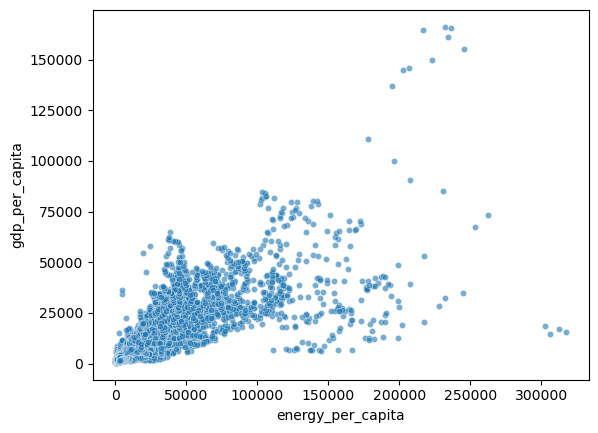

In [28]:
sns.scatterplot(x = 'energy_per_capita', y = 'gdp_per_capita', data = df_energy, s = 20, alpha = 0.6)
plt.show()

The above graph shows that there is a positive relationship between 'gdp_per_capita' and 'energy_per_capita'.

##### Now exploring the gdp_per_capita and energy_per_capita relationship
First I will find what data I have.

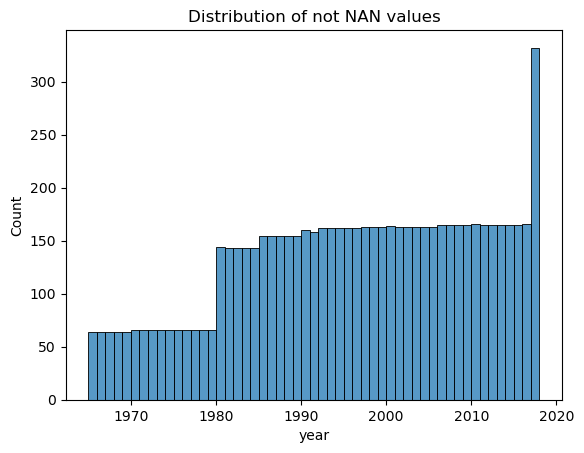

In [29]:
# Finding the distribution of not NaN energy and gdp records
test_df = df_energy[['year', 'energy_per_capita', 'gdp_per_capita']]
test_df.dropna(inplace = True)
sns.histplot(x = 'year', data = test_df, bins = (max(test_df.year) - min(test_df.year)))
plt.title("Distribution of not NAN values")
plt.show()

This graph shows that the years 1980 to 2018 are the years with the most data.

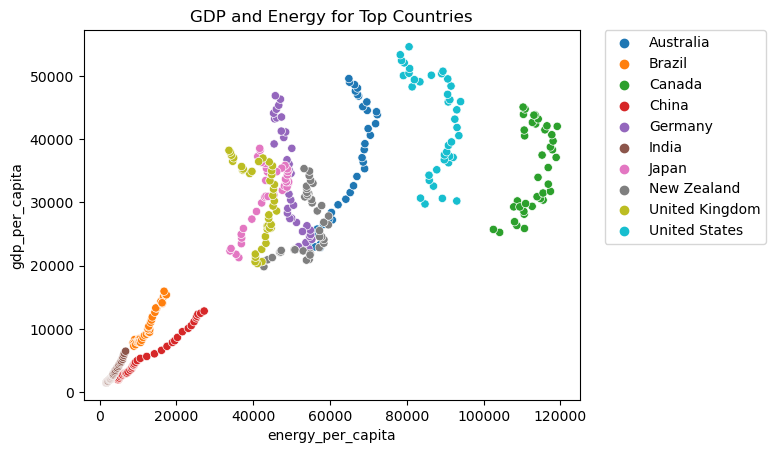

In [30]:
firstYear = 1980
lastYear = 2018

# Removing values outside of these ranges from the dataset so that I can compare like for like
df_energy = df_energy[(df_energy['year'] >= firstYear) & (df_energy['year'] <= lastYear)]

# Exploring the relationship between gdp per capita and energy per capita for top countries
countries = ['Australia', 'Brazil', 'Canada', 'China', 'Germany', 'India', 'Japan', 'New Zealand', 'United Kingdom', 'United States']
df_Top_Countries = df_energy[['country','energy_per_capita', 'gdp_per_capita', 'year']][df_energy['country'].isin(countries)]

sns.scatterplot(x = 'energy_per_capita', y = 'gdp_per_capita', hue = 'country', data = df_Top_Countries)
plt.title("GDP and Energy for Top Countries")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0)
plt.show()

This shows that some of the top countries with the highest gdp and energy usage have managed to decrease energy per capita while still increasing gdp per capita.  The countries with a lower gdp and energy usage do not show this trend.

##### What about poor countries?
What does the energy per capita look like for the 10 poorest countries?  And for poor countries that have had the largest recent increase in their gdp per capita, is energy consumption per capita related to this increase in gdp per capita?

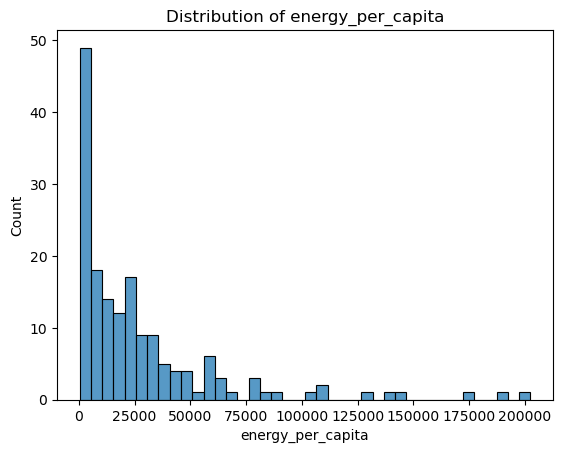

In [31]:
# 2018 is the latest year that has good gdp_per_capita data so I will use this as the latest year
# Taking a snapshot of the energy distribution at the previous energy consumption that I am looking at
snapshot_df = df_energy[['country','energy_per_capita', 'gdp_per_capita', 'year']][df_energy['year'] == lastYear]
snapshot_df.dropna(inplace = True)
sns.histplot(x = 'energy_per_capita', data = snapshot_df, bins = 40)
plt.title("Distribution of energy_per_capita")
plt.show()

I'll make bins of energy_per_capita at less than 1000, 1000 - 20000, greater than 20000 to classify the countries into.  I have made this decision iteratively. Based on the above graph and by trying different values for 'energy_per_capita'.

In [32]:
# What countries have increased their energy_per_capita consumption the most for the period 1980 to 2018, the years with the least missing data.

# Finding the countries that have both 1980 values and 2018 values
model_df = df_energy[['country','energy_per_capita', 'gdp_per_capita', 'year']][(df_energy['year'] == firstYear) | (df_energy['year'] == lastYear)]
counts = model_df[['country']].groupby('country').value_counts()
countries = counts[counts.isin([2])]
# These are the countries that have both 1980 and 2018 values
countries = list(countries.index)
# Filter model_df so that only these countries are in it
model_df = model_df[model_df['country'].isin(countries)]
model_df = model_df.dropna()

model_df['previous_energy_per_capita'] = model_df['energy_per_capita'].shift(1)
model_df['previous_gdp_per_capita'] = model_df['gdp_per_capita'].shift(1)
model_df = model_df[model_df['year'] == lastYear]
model_df['energy_dif'] = model_df.apply(lambda x: x.energy_per_capita - x.previous_energy_per_capita, axis = 1)
model_df['gdp_dif'] = model_df.apply(lambda x: x.gdp_per_capita - x.previous_gdp_per_capita, axis = 1)
model_df['energy_dif_proportion'] = model_df.apply(lambda x: x.energy_dif/x.energy_per_capita, axis = 1)

# Dividing the countries based on energy_dif_proportion and initial energy usage
# so that I am comparing like for like countries
# Finding how quickly and slowly developing the low energy usage countries are
low_countries = model_df[model_df['previous_energy_per_capita'] < 1000]
quicklyDevelopingLowCountries = low_countries.nlargest(10, 'energy_dif_proportion')
slowlyDevelopingLowCountries = low_countries.nsmallest(10, 'energy_dif_proportion')

# Finding how quickly and slowly developing the middle energy usage countries are
middleCountries = model_df[(model_df['previous_energy_per_capita'] >= 1000) & (model_df['previous_energy_per_capita'] < 20000)]
quicklyDevelopingMiddleCountries = middleCountries.nlargest(10, 'energy_dif_proportion')
slowlyDevelopingMiddleCountries = middleCountries.nsmallest(10, 'energy_dif_proportion')

# Finding how quickly and slowly developing the high energy usage countries are (developing as in increasing their energy consumption)
highCountries = model_df[(model_df['previous_energy_per_capita'] >= 20000)]
quicklyDevelopingHighCountries = highCountries.nlargest(10, 'energy_dif_proportion')
slowlyDevelopingHighCountries = highCountries.nsmallest(10, 'energy_dif_proportion')

# Finding the countries with a low gdp per capita at 1980, then picking the 25 countries that had the greatest increase in gdp between 1980 and 2018
# I'll use these emerging countries to model GDP and Energy Usage.
poor_Countries = model_df[model_df['previous_gdp_per_capita'] < 5000]
emerging_Countries = poor_Countries.nlargest(25, 'gdp_dif')

In [33]:
# Creating two dataframes so that it is easier to see the two groups for the quickly developing low energy usage countries
fastestDevLowCountries = quicklyDevelopingLowCountries[quicklyDevelopingLowCountries['energy_per_capita'] > 5000]
middleDevLowCountries = quicklyDevelopingLowCountries[quicklyDevelopingLowCountries['energy_per_capita'] <= 5000]

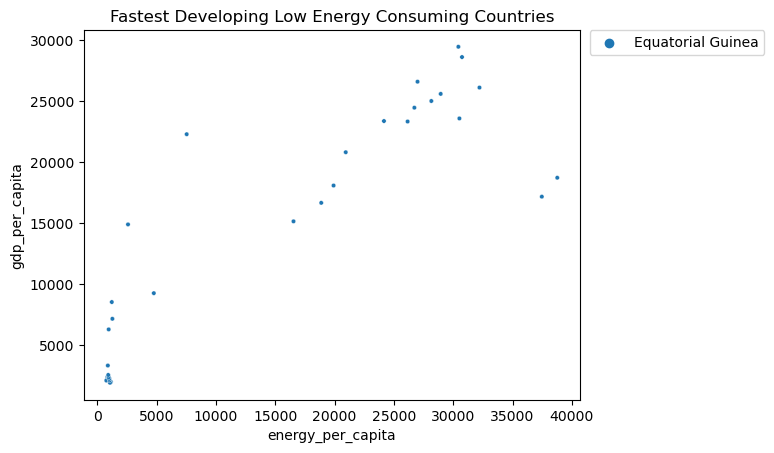

In [34]:
model_df = df_energy[['country','year','energy_per_capita', 'gdp_per_capita']]
model_df = model_df[model_df['country'].isin(fastestDevLowCountries.country)]
sns.scatterplot(x = 'energy_per_capita', y = 'gdp_per_capita', hue = 'country', data = model_df, s = 10)
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
plt.title("Fastest Developing Low Energy Consuming Countries")
plt.show()

Equatorial Guinea started out very poor with low gdp per capita and energy usage per capita.  Somehow, since then, the gdp per capita and energy per capita have increased massively.  Equatorial Guinea is an outlier from the norm.

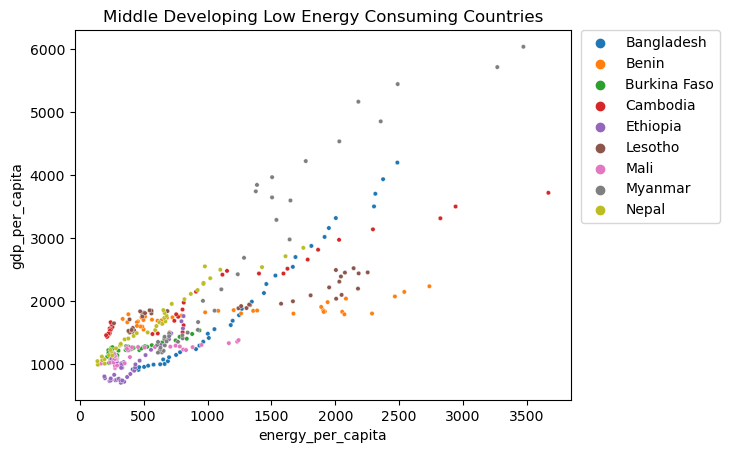

In [35]:
model_df = df_energy[['country','year','energy_per_capita', 'gdp_per_capita']]
model_df = model_df[model_df['country'].isin(middleDevLowCountries.country)]
sns.scatterplot(x = 'energy_per_capita', y = 'gdp_per_capita', hue = 'country', data = model_df, s = 10)
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
plt.title("Middle Developing Low Energy Consuming Countries")
plt.show()

This plot shows a positive relationship between gdp per capita and energy per capita for most countries.  Two countries, Benin and Lesotho, have increasing energy per capita's but their gdp per capita is not increasing by very much.

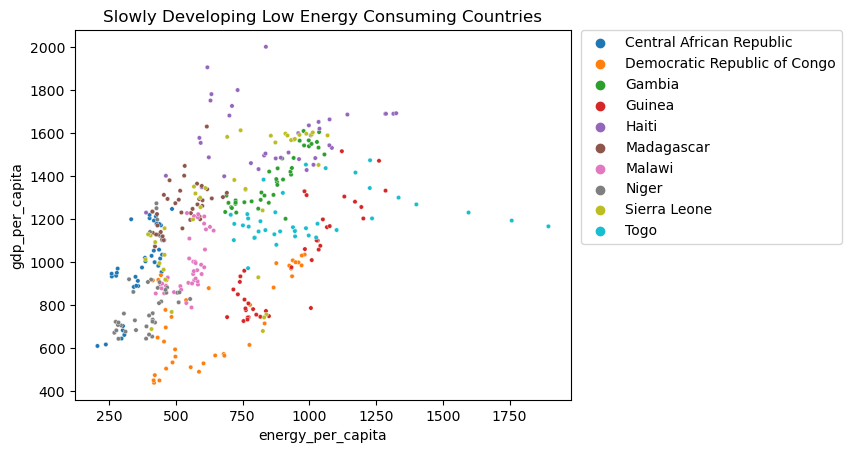

In [36]:
model_df = df_energy[['country','year','energy_per_capita', 'gdp_per_capita']]
model_df = model_df[model_df['country'].isin(slowlyDevelopingLowCountries.country)]
sns.scatterplot(x = 'energy_per_capita', y = 'gdp_per_capita', hue = 'country', data = model_df, s = 10)
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
plt.title("Slowly Developing Low Energy Consuming Countries")
plt.show()

This plot is of the countries that use the least energy and have not been developing much more energy usage since 1980.  This plot is a bit of a mess.  None of the countries have significantly increased either their energy per capita or their gdp per capita since 1980.


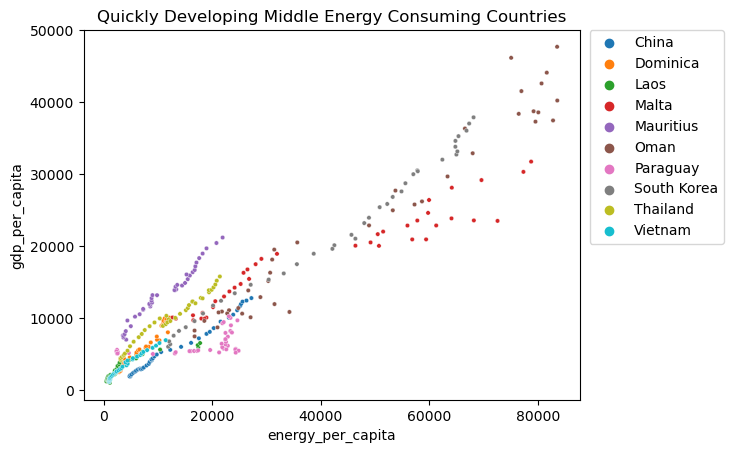

In [37]:
model_df = df_energy[['country','year','energy_per_capita', 'gdp_per_capita']]
model_df = model_df[model_df['country'].isin(quicklyDevelopingMiddleCountries.country)]
sns.scatterplot(x = 'energy_per_capita', y = 'gdp_per_capita', hue = 'country', data = model_df, s = 10)
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
plt.title("Quickly Developing Middle Energy Consuming Countries")
plt.show()

This plot shows a clear positive relationship between gdp per capita and energy per capita.

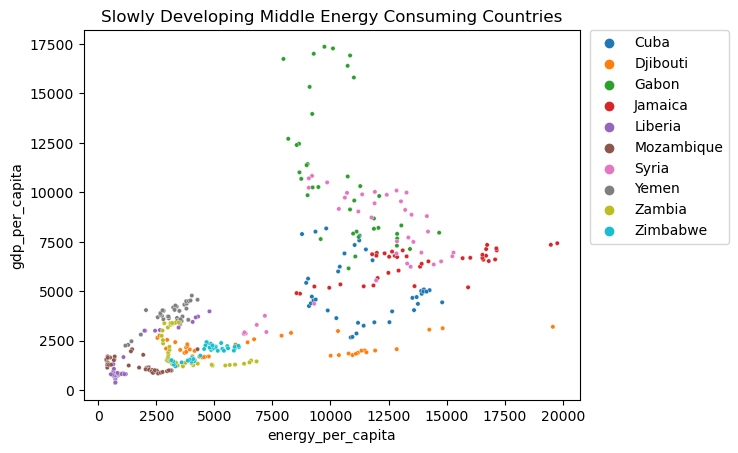

In [38]:
model_df = df_energy[['country','year','energy_per_capita', 'gdp_per_capita']]
model_df = model_df[model_df['country'].isin(slowlyDevelopingMiddleCountries.country)]
sns.scatterplot(x = 'energy_per_capita', y = 'gdp_per_capita', hue = 'country', data = model_df, s = 10)
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
plt.title("Slowly Developing Middle Energy Consuming Countries")
plt.show()

All of these countries had a higher energy per capita in 1980 than in 2018, so they are all outliers in that regard.  Syria is an outlier as well with a period where gdp_per_capita is increasing while energy_per_capita is decreasing.  Gabon has quite a large increase in gdp per capita while energy per capita does not tend to increase.

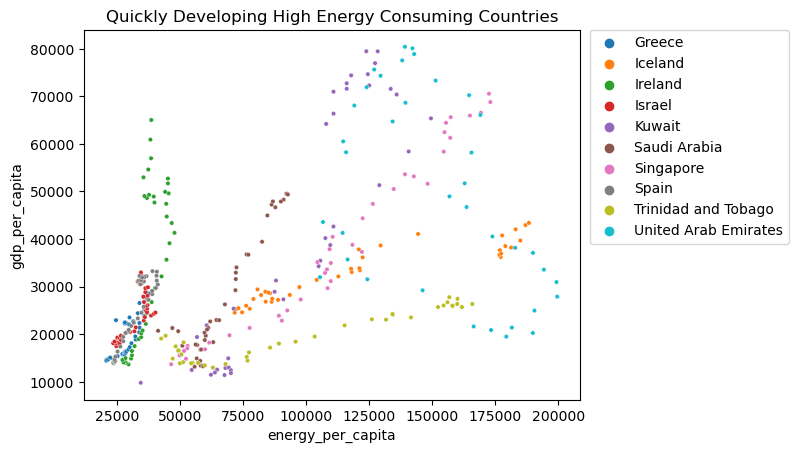

In [39]:
model_df = df_energy[['country','year','energy_per_capita', 'gdp_per_capita']]
model_df = model_df[model_df['country'].isin(quicklyDevelopingHighCountries.country)]
sns.scatterplot(x = 'energy_per_capita', y = 'gdp_per_capita', hue = 'country', data = model_df, s = 10)
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
plt.title("Quickly Developing High Energy Consuming Countries")
plt.show()

This plot shows a clear positive relationship between energy per capita and gdp per capita for most of these countries.  Greece, Spain, Israel, and Ireland are exceptions in that they have a much steeper relationship between energy_per_capita and gdp_per_capita.

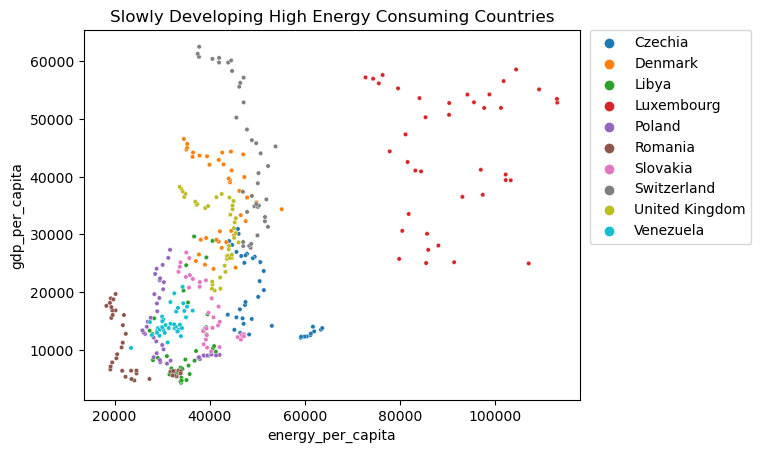

In [40]:
model_df = df_energy[['country','year','energy_per_capita', 'gdp_per_capita']]
model_df = model_df[model_df['country'].isin(slowlyDevelopingHighCountries.country)]
sns.scatterplot(x = 'energy_per_capita', y = 'gdp_per_capita', hue = 'country', data = model_df, s = 10)
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
plt.title("Slowly Developing High Energy Consuming Countries")
plt.show()

This plot shows that there are some countries that have increasing gdp per capita while their energy per capita is either remaining about the same or even decreasing.

Overall though, in most of the plots, gdp per capita increases with energy per capita.  There are a lot of idiosyncrasies between the different countries, this is important as it shows that many other things affect gdp, not just energy.  Among the highest energy using countries, some have had decreased energy usage while having a higher gdp.  Notably, this behaviour is not present among the lowest energy using countries.  This means that it is possible for a country to conserve resources while producing more if it is already a well developed country that uses a lot of energy.  But this doesn't seem to happen among less developed countries.  Rather, if a less developed country is not increasing its energy usage, its gdp does not really tend to increase.  Instead the country just seems to stagnate with nothing much changing.  This is probably because neither of these things can increase when a large proportion of the country are too busy worrying about their next meal to think about anything else.

## 5. Task 3: Modelling  - Target is build models to predict future xx<a name="task-3"></a>

### 5.1 Predict the Future cumulative_luc_co2  for Top 10 Countries (1850 -2021 ~ 2035) <a name="regression"></a>


"cumulative_luc_co2 " refers to the total amount of CO₂ emissions resulting from changes in how land is used. For instance, when forests are cleared for agriculture or urban development, the carbon stored in trees is released into the atmosphere. This is a significant source of global greenhouse gas emissions. The focus is to forcast the greenhouse gas emissionss for the top 10 selected countries.

##### Check for NAs

In [32]:
countries = ['Australia', 'Brazil', 'Canada', 'China', 'Germany', 'India', 'Japan', 'New Zealand', 'United Kingdom', 'United States']

for country in countries:
    df_new = df[['year', 'cumulative_luc_co2']][(df['country'] == country) & (df['year'] >= 1850)]
    missing_values = df_new['cumulative_luc_co2'].isna().sum()
    print(f"Number of missing values in 'cumulative_luc_co2' column for {country} from 1850 onwards: {missing_values}")


Number of missing values in 'cumulative_luc_co2' column for Australia from 1850 onwards: 0
Number of missing values in 'cumulative_luc_co2' column for Brazil from 1850 onwards: 0
Number of missing values in 'cumulative_luc_co2' column for Canada from 1850 onwards: 0
Number of missing values in 'cumulative_luc_co2' column for China from 1850 onwards: 0
Number of missing values in 'cumulative_luc_co2' column for Germany from 1850 onwards: 0
Number of missing values in 'cumulative_luc_co2' column for India from 1850 onwards: 0
Number of missing values in 'cumulative_luc_co2' column for Japan from 1850 onwards: 0
Number of missing values in 'cumulative_luc_co2' column for New Zealand from 1850 onwards: 0
Number of missing values in 'cumulative_luc_co2' column for United Kingdom from 1850 onwards: 0
Number of missing values in 'cumulative_luc_co2' column for United States from 1850 onwards: 0


#### Plot original 10 contries Cumulative_luc_co2 ( 1850 - 2021)

In [33]:
countries = ['Australia', 'Brazil', 'Canada', 'China', 'Germany', 'India', 'Japan', 'New Zealand', 'United Kingdom', 'United States']

fig = px.line()

for country in countries:
    df_new = df[['year', 'cumulative_luc_co2']][(df['country'] == country) & (df['year'] >= 1850)]
   
    fig.add_scatter(x=df_new['year'], y=df_new['cumulative_luc_co2'], name=country)

fig.update_layout(
    xaxis_title='Year',
    yaxis_title='Cumulative LUC CO2',
    title='Cumulative LUC CO2 over Time - All Countries',
    showlegend=True,
    template='plotly_white'
)

fig.show()

#### Polynomial Model

In [34]:
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import PolynomialFeatures

fig = go.Figure()
predictions_data = []

rmse_values = []

for country in countries:
    df_new = df[['year', 'cumulative_luc_co2']][(df['country'] == country) & (df['year'] >= 1850)]
    
    # Prepare the data
    x = df_new['year'].values
    y = df_new['cumulative_luc_co2'].values

    # Fit the polynomial regression model
    degree = 2  # Set the degree of the polynomial model

    poly_features = PolynomialFeatures(degree=degree)
    x_poly = poly_features.fit_transform(x.reshape(-1, 1))

    model = LinearRegression()
    model.fit(x_poly, y)

    # Make predictions for the years 2022 to 2035
    x_pred = np.arange(2022, 2035)  # Generate x-values for prediction (2022 to 2035)
    x_pred_poly = poly_features.transform(x_pred.reshape(-1, 1))

    y_pred = model.predict(x_pred_poly)

    # Store the predictions in a dataframe
    country_predictions = pd.DataFrame({'Year': x_pred, f'Predicted cumulative_luc_co2 - {country}': y_pred})
    predictions_data.append(country_predictions)

    # Calculate RMSE
    y_pred_train = model.predict(x_poly)
    rmse = np.sqrt(mean_squared_error(y, y_pred_train))
    rmse_values.append((country, rmse))

    # Add the actual data trace
    fig.add_trace(go.Scatter(x=df_new['year'], y=df_new['cumulative_luc_co2'],
                             mode='lines', name=f' {country}', line=dict(color='blue')))

    # Add the predicted data trace
    fig.add_trace(go.Scatter(x=country_predictions['Year'], y=country_predictions[f'Predicted cumulative_luc_co2 - {country}'],
                             mode='lines', name=f'Pred - {country}', line=dict(color='red')))

fig.update_layout(
    xaxis_title='Year',
    yaxis_title='Cumulative LUC CO2',
    title='Actual vs Predicted Cumulative LUC CO2 - All Countries',
    legend=dict(title='Data'),
    showlegend=True,
    template='plotly_white'
)

fig.show()

In [35]:
# Create a DataFrame to store the RMSE values
rmse_poly = pd.DataFrame(rmse_values, columns=['Country', 'RMSE'])
rmse_poly


,Country,RMSE
0,Australia,668.302581
1,Brazil,3121.476762
2,Canada,1459.253621
3,China,2705.793488
4,Germany,219.578238
5,India,3100.064423
6,Japan,466.325191
7,New Zealand,262.722488
8,United Kingdom,79.523333
9,United States,3411.337199


The 2nd degree polynomial model doesn't perform well as the large root mean squared error. The prediction line has a big jump which shows it may not capture the underlying data pattern.

### ARIMA model Is Not Capture the Underlying Pattern
ARIMA (Autoregressive Integrated Moving Average): ARIMA models are commonly used for time series forecasting. They incorporate autoregressive (AR), moving average (MA), and differencing components. ARIMA models can capture the trend and seasonality in the data.

In [36]:
from statsmodels.tsa.stattools import adfuller

for country in countries:
    df_new = df[['year', 'cumulative_luc_co2']][(df['country'] == country) & (df['year'] >= 1850)]
    
    adf_result = adfuller(df_new['cumulative_luc_co2'])
    print(f"ADF Statistic for {country}: {adf_result[0]}")
    print(f"p-value for {country}: {adf_result[1]}")
    print("-------------------------")

ADF Statistic for Australia: 0.1890805862577832
p-value for Australia: 0.9716424642411552
-------------------------
ADF Statistic for Brazil: 0.34986059728497887
p-value for Brazil: 0.9795199111118374
-------------------------
ADF Statistic for Canada: -2.566740458334749
p-value for Canada: 0.10006800162570928
-------------------------
ADF Statistic for China: 0.41628788308190623
p-value for China: 0.9820939363005979
-------------------------
ADF Statistic for Germany: -1.3320569376899216
p-value for Germany: 0.6143816423090196
-------------------------
ADF Statistic for India: -1.2634974251350035
p-value for India: 0.6457025146652932
-------------------------
ADF Statistic for Japan: -1.405101235683976
p-value for Japan: 0.5798280932839408
-------------------------
ADF Statistic for New Zealand: -1.6418257749880005
p-value for New Zealand: 0.46130693224354496
-------------------------
ADF Statistic for United Kingdom: -2.416340603709212
p-value for United Kingdom: 0.13717740768675207


Based on the ADF test results, only the 'cumulative_luc_co2' data for the United States shows some evidence of stationarity (p-value < 0.05). For the other countries, the data does not provide strong evidence to suggest stationarity.

Next step is to apply first-order differencing to the 'cumulative_luc_co2' data to get ready for proceeding with fitting an ARIMA model. For United States, applying differencing might potentially enhance the model's ability to capture any remaining trends or seasonality. So decision is made to appply differencing to all 10 countries and find optimal order.


In [37]:
from pmdarima import auto_arima

optimal_orders = []

for country in countries:
    df_new = df[['year', 'cumulative_luc_co2']][(df['country'] == country) & (df['year'] >= 1850)]
    
    # Apply first-order differencing
    df_new['diff_cumulative_luc_co2'] = df_new['cumulative_luc_co2'].diff().dropna()
    
    # Use auto_arima to determine the optimal ARIMA order
    model = auto_arima(df_new['cumulative_luc_co2'], seasonal=False)
    
    # Retrieve the optimal ARIMA order
    optimal_order = model.order
    
    # Store the optimal order in a dictionary
    optimal_order_dict = {'country': country, 'ARIMA Order': optimal_order}
    
    # Append the dictionary to the list
    optimal_orders.append(optimal_order_dict)

# Create a DataFrame from the list of optimal orders
optimal_orders_df = pd.DataFrame(optimal_orders)

# Print the DataFrame
optimal_orders_df

ModuleNotFoundError: No module named 'pmdarima'

Prediction using ARIMA model for 2022 to 2035 and plot with original data together.

In [ ]:
from statsmodels.tsa.arima.model import ARIMA

fig = go.Figure()

for country in countries:
    df_country = df[['year', 'cumulative_luc_co2']][(df['country'] == country) & (df['year'] >= 1850)]
    
    # Retrieve the optimal ARIMA order for the current country
    optimal_order = optimal_orders_df[optimal_orders_df['country'] == country]['ARIMA Order'].iloc[0]
    
    # Fit the ARIMA model
    arima_model = ARIMA(df_country['cumulative_luc_co2'], order=optimal_order)
    arima_result = arima_model.fit()
    
    # Forecast future values
    start_year = 2022
    end_year = 2035
    future_index = pd.Index(np.arange(start_year, end_year + 1), name='year')
    forecast = arima_result.get_forecast(steps=len(future_index))
    predicted_values = forecast.predicted_mean
    
    # Create a dataframe with the predicted values
    predictions_df = pd.DataFrame({'year': future_index,
                                   f'predicted_cumulative_luc_co2 - {country}': predicted_values})
    
    # Add the actual data trace
    fig.add_trace(go.Scatter(x=df_country['year'], y=df_country['cumulative_luc_co2'],
                             mode='lines', name=f'{country}', line=dict(color='blue')))
    
    # Add the predicted data trace
    fig.add_trace(go.Scatter(x=predictions_df['year'], y=predictions_df[f'predicted_cumulative_luc_co2 - {country}'],
                             mode='lines', name=f'Pred - {country}', line=dict(color='red')))

fig.update_layout(
    xaxis_title='Year',
    yaxis_title='Cumulative LUC CO2',
    title='Actual vs Predicted Cumulative LUC CO2 - All Countries',
    legend=dict(title='Data'),
    showlegend=True,
    template='plotly_white'
)

fig.show()

In [ ]:
predictions_arima_df = pd.DataFrame(columns=['Country', 'Year', 'Predicted_cumulative_luc_co2'])

for country in countries:
    df_country = df[['year', 'cumulative_luc_co2']][(df['country'] == country) & (df['year'] >= 1850)]
    optimal_order = optimal_orders_df[optimal_orders_df['country'] == country]['ARIMA Order'].iloc[0]
    
    arima_model = ARIMA(df_country['cumulative_luc_co2'], order=optimal_order)
    arima_result = arima_model.fit()
    
    start_year = 2022
    end_year = 2035
    future_index = pd.Index(np.arange(start_year, end_year + 1), name='Year')
    forecast = arima_result.get_forecast(steps=len(future_index))
    predicted_values = forecast.predicted_mean
    
    country_predictions_df = pd.DataFrame({'Country': country, 'Year': future_index, 'Predicted_cumulative_luc_co2': predicted_values})
    predictions_arima_df = predictions_arima_df.append(country_predictions_df, ignore_index=True)

predictions_arima_df


In [ ]:
# DataFrame to store the RMSE values
rmse_arima = pd.DataFrame({'Country': countries})

for i, country in enumerate(countries):
    df_country = df[['year', 'cumulative_luc_co2']][(df['country'] == country) & (df['year'] >= 1850)]
    
    # Retrieve the optimal ARIMA order for the current country
    optimal_order = optimal_orders_df[optimal_orders_df['country'] == country]['ARIMA Order'].iloc[0]
    
    # Fit the ARIMA model
    arima_model = ARIMA(df_country['cumulative_luc_co2'], order=optimal_order)
    arima_result = arima_model.fit()
    
    # Make predictions on the training data
    y_pred = arima_result.predict(start=0, end=len(df_country)-1)
    
    # Calculate RMSE
    rmse = np.sqrt(mean_squared_error(df_country['cumulative_luc_co2'], y_pred))
    
    # Store the RMSE value in the DataFrame
    rmse_arima.loc[i, 'RMSE'] = rmse

# Print the DataFrame with RMSE values
rmse_arima

Tthe root mean sqaured error is much smaller than previous polynomial model. The prediction line also looks better now.

### SARIMAX

#### Prepare data and find optimal order and seasonal order for SARIMAX model

In [ ]:
from statsmodels.tsa.statespace.sarimax import SARIMAX
import itertools

# Create an empty DataFrame to store the optimal orders
optimal_orders_df = pd.DataFrame(columns=['country', 'ARIMA Order', 'Seasonal Order'])

for country in countries:
    df_country = df[df['country'] == country]
    df_country['year'] = pd.to_datetime(df_country['year'], format='%Y')  # Convert 'year' to datetime
    df_country = df_country.set_index('year')  # Set 'year' as the index
    y = df_country['cumulative_luc_co2']
    train = y[:'2015']

    # Define the range of parameters to search
    p = range(0, 3)  # AR order
    d = range(0, 2)  # Differencing order
    q = range(0, 3)  # MA order
    P = range(0, 2)  # Seasonal AR order
    D = range(0, 1)  # Seasonal differencing order
    Q = range(0, 2)  # Seasonal MA order
    s = 12  # Seasonal periodicity

    # Perform grid search to find optimal order
    best_aic = float('inf')
    best_order = None

    for param in itertools.product(p, d, q, P, D, Q):
        order = param[:3]
        seasonal_order = param[3:] + (s,)

        try:
            model = SARIMAX(train, order=order, seasonal_order=seasonal_order)
            result = model.fit()
            aic = result.aic

            if aic < best_aic:
                best_aic = aic
                best_order = (order, seasonal_order)

        except:
            continue

    optimal_orders_df = optimal_orders_df.append({'country': country, 'ARIMA Order': best_order[0],
                                                  'Seasonal Order': best_order[1]}, ignore_index=True)

# Print the optimal orders DataFrame
print("Optimal SARIMAX Orders:")
optimal_orders_df

Plot original & prediction based on optimal orders

In [ ]:
fig = go.Figure()

# Loop over the countries
for country in countries:
    # Filter the data for the current country
    df_country = df[['year', 'cumulative_luc_co2']][(df['country'] == country) & (df['year'] >= 1850)]
    
    # Retrieve the optimal SARIMAX order for the current country
    optimal_order = optimal_orders_df[optimal_orders_df['country'] == country]['ARIMA Order'].iloc[0]
    seasonal_order = optimal_orders_df[optimal_orders_df['country'] == country]['Seasonal Order'].iloc[0]
    
    # Fit the SARIMAX model
    sarimax_model = SARIMAX(df_country['cumulative_luc_co2'], order=optimal_order, seasonal_order=seasonal_order)
    sarimax_result = sarimax_model.fit()
    
    # Forecast future values
    start_year = 2022
    end_year = 2035
    future_index = pd.Index(np.arange(start_year, end_year + 1), name='year')
    forecast = sarimax_result.get_forecast(steps=len(future_index))
    predicted_values = forecast.predicted_mean
    
    # Create a dataframe with the predicted values
    predictions_df = pd.DataFrame({'year': future_index,
                                   f'predicted_cumulative_luc_co2 - {country}': predicted_values})
    
    # Add the actual data trace
    fig.add_trace(go.Scatter(x=df_country['year'], y=df_country['cumulative_luc_co2'],
                             mode='lines', name=f'{country}', line=dict(color='blue')))
    
    # Add the predicted data trace
    fig.add_trace(go.Scatter(x=predictions_df['year'], y=predictions_df[f'predicted_cumulative_luc_co2 - {country}'],
                             mode='lines', name=f'Pred - {country}', line=dict(color='red')))

fig.update_layout(
    xaxis_title='Year',
    yaxis_title='Cumulative LUC CO2',
    title='Actual vs Predicted Cumulative LUC CO2 - All Countries',
    legend=dict(title='Data'),
    showlegend=True,
    template='plotly_white'
)

fig.show()


In [ ]:
# Create an empty DataFrame to store the RMSE values
rmse_sarimax = pd.DataFrame(columns=['Country', 'RMSE'])

# Loop over the countries
for country in countries:
    # Filter the data for the current country
    df_country = df[['year', 'cumulative_luc_co2']][(df['country'] == country) & (df['year'] >= 1850)]

    # Retrieve the optimal SARIMAX order for the current country
    optimal_order = optimal_orders_df[optimal_orders_df['country'] == country]['ARIMA Order'].iloc[0]
    seasonal_order = optimal_orders_df[optimal_orders_df['country'] == country]['Seasonal Order'].iloc[0]

    # Fit the SARIMAX model
    sarimax_model = SARIMAX(df_country['cumulative_luc_co2'], order=optimal_order, seasonal_order=seasonal_order)
    sarimax_result = sarimax_model.fit()

    # Forecast future values
    start_year = 2022
    end_year = 2035
    future_index = pd.Index(np.arange(start_year, end_year + 1), name='year')
    forecast = sarimax_result.get_forecast(steps=len(future_index))
    predicted_values = forecast.predicted_mean

    # Calculate the RMSE
    actual_values = df_country['cumulative_luc_co2'].values[-len(predicted_values):]
    rmse = np.sqrt(mean_squared_error(actual_values, predicted_values))

    # Append the RMSE to the DataFrame
    rmse_sarimax = rmse_sarimax.append({'Country': country, 'RMSE': rmse}, ignore_index=True)

# Print the DataFrame with RMSE values
rmse_sarimax

The RMSE is getting worse compared to ARIMA model.Also Brizal prdeiction line looks unrealistic.

#### Clean & prepare above prediction dataframe & Merge the prediction to original datafor Tableau

In [ ]:
# Rename the columns in predictions_arima_df
predictions_arima_df = predictions_arima_df.rename(columns={'Country': 'country', 'Year': 'year'})

# Merge predictions_arima_df with the original df dataframe
combined_df = pd.concat([df, predictions_arima_df], ignore_index=True)

# Save the combined dataframe to a CSV file
combined_df.to_csv('combined.csv', index=False)


#### Model conclusion: ARIMA model is selected based on lowest RMSE as well as prediction line visualization

In [18]:
# Merge the dataframes
comparison_df = pd.merge(rmse_poly, rmse_arima, on='Country', suffixes=('_poly', '_arima'))
comparison_df = pd.merge(comparison_df, rmse_sarimax, on='Country', suffixes=(None, '_sarimax'))

comparison_df = comparison_df.rename(columns={'RMSE': 'RMSE_sarimax'})
comparison_df

,Country,RMSE_poly,RMSE_arima,RMSE_sarimax
0,Australia,668.302581,57.254386,728.133382
1,Brazil,3121.476762,129.395875,4990.067562
2,Canada,1459.253621,10.720527,1519.034736
3,China,2705.793488,94.568514,3819.624219
4,Germany,219.578238,6.719870,91.163505
5,India,3100.064423,57.309696,1611.311587
6,Japan,466.325191,2.555098,66.363835
7,New Zealand,262.722488,4.743915,30.879370
8,United Kingdom,79.523333,4.844410,69.264958
9,United States,3411.337199,96.019260,1207.416171


---

### 5.2 Forecasting the Share of Renewable Energy for Top 10 Countries (1990-2021 ~ 2035) <a name="time-series"></a>

#### Handling missing values

In [16]:
pred_cols = ['country','year', 'iso_code', 'population', 'biofuel_consumption', 'biofuel_share_energy', 'coal_consumption', 'coal_share_energy', 'gas_consumption', 'gas_share_energy','hydro_consumption', 'hydro_share_energy', 'nuclear_consumption','nuclear_share_energy', 'oil_consumption', 'oil_share_energy', 'other_renewable_consumption', 'other_renewables_share_energy', 'primary_energy_consumption', 'renewables_consumption', 'renewables_share_energy', 'solar_consumption', 'solar_share_energy', 'wind_consumption', 'wind_share_energy']

missing_val = green_df[(green_df['country'].isin(countries)) &
                       (green_df['year'] >= 1990) &
                       (green_df['year'] <= 2021) &
                       (green_df['iso_code'].notnull())][pred_cols].isnull().sum()
missing_val

country                           0
year                              0
iso_code                          0
population                        0
biofuel_consumption              64
biofuel_share_energy             64
coal_consumption                  0
coal_share_energy                 0
gas_consumption                   0
gas_share_energy                  0
hydro_consumption                 0
hydro_share_energy                0
nuclear_consumption               2
nuclear_share_energy              2
oil_consumption                   0
oil_share_energy                  0
other_renewable_consumption       0
other_renewables_share_energy     0
primary_energy_consumption        0
renewables_consumption            0
renewables_share_energy           0
solar_consumption                 0
solar_share_energy                0
wind_consumption                  0
wind_share_energy                 0
dtype: int64

In [17]:
green_pred = green_df.copy()

# replacing missing values with zero (same as other years)
green_pred.loc[(green_pred['country'].isin(countries)) &
                  (green_pred['year'] >= 1990) &
                  (green_pred['year'] <= 2021) &
                  (green_pred['iso_code'].notnull()), pred_cols] = green_pred[(green_pred['country'].isin(countries)) &
                                                                                   (green_pred['year'] >= 1990) &
                                                                                   (green_pred['year'] <= 2021) &
                                                                                   (green_pred['iso_code'].notnull())][pred_cols].fillna(0)

### Long Short Term Memory Model

##### LSTM (with retrain full data for preditions)

In [ ]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense

np.random.seed(111)

predictions_dict = {}

def create_dataset(dataset, look_back=1):
    dataX, dataY = [], []
    for i in range(len(dataset) - look_back):
        dataX.append(dataset[i:(i + look_back), 0])
        dataY.append(dataset[i + look_back, 0])
    return np.array(dataX), np.array(dataY)

for country in countries:
    data_country = green_pred[(green_pred['country'] == country) &
                              (green_pred['year'] >= 1990) &
                              (green_pred['year'] <= 2021) &
                              (green_pred['iso_code'].notnull())]
    lstm_model = data_country['renewables_share_energy'].values.astype('float32').reshape(-1, 1)
    scaler = MinMaxScaler(feature_range=(0, 1))
    lstm_model = scaler.fit_transform(lstm_model)

    # Split and format the data
    train_size = int(len(lstm_model) * 0.8)
    train, test = lstm_model[0:train_size, :], lstm_model[train_size:, :]
    trainX, trainY = create_dataset(train)
    testX, testY = create_dataset(test)
    trainX, testX = trainX.reshape(-1, 1, 1), testX.reshape(-1, 1, 1)

    # Define and train the model
    lstm = Sequential([LSTM(5, input_shape=(1, 1)), Dense(1)])
    lstm.compile(loss='mean_squared_error', optimizer='adam')
    lstm.fit(trainX, trainY, epochs=100, batch_size=1, verbose=2)

    # Evaluate the model
    trainPredict = lstm.predict(trainX)
    testPredict = lstm.predict(testX)
    trainPredict, testPredict = scaler.inverse_transform(trainPredict), scaler.inverse_transform(testPredict)
    mse = mean_squared_error(scaler.inverse_transform(testY.reshape(-1, 1)), testPredict)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(scaler.inverse_transform(testY.reshape(-1, 1)), testPredict)

    # Retrain the model on the full data
    fullX, fullY = create_dataset(lstm_model)
    fullX = fullX.reshape(-1, 1, 1)
    lstm.fit(fullX, fullY, epochs=100, batch_size=1, verbose=2)

    # Generate future predictions
    futurePredict = list()
    current_step = lstm_model[-1, :] 
    for _ in range(15):
        current_step = current_step.reshape(1, 1, 1)
        next_step = lstm.predict(current_step) 
        futurePredict.append(next_step[0])  
        current_step = np.array(next_step) 
    predictions_dict[country] = {'future_predict': scaler.inverse_transform(futurePredict)}


In [ ]:
print("Mean Squared Error: ", mse)
print("Root Mean Squared Error: ", rmse)
print("Mean Absolute Error: ", mae)

In [ ]:
color_list = ['#1f77b4',  # blue (AUS)
              '#ff7f0e',  # orange (BRA)
              '#2ca02c',  # green (CAN)
              '#d62728',  # red (CHN)
              '#9467bd',  # purple (DEU)
              '#8c564b',  # brown (IND)
              '#e377c2',  # pink (JPN)
              '#7f7f7f',  # gray (NZL)
              '#bcbd22',  # yellow-green (GBR)
              '#17becf'   # teal (USA)
              ]
fig = go.Figure()

# Generate future years array
future_years = list(range(2022, 2036))

# Loop over each country and add the traces to the figure
for i, country in enumerate(countries):
    # Filter the data for the country of interest
    data_country = green_pred.loc[(green_pred['country'] == country) & (green_pred['iso_code'].notnull())]
    data_country = data_country.loc[(data_country['year'] >= 1990) & (data_country['year'] <= 2021)]
    
    # Add the actual data to the figure
    fig.add_trace(go.Scatter(x=data_country['year'], 
                             y=data_country['renewables_share_energy'], 
                             mode='lines', 
                             name=f"{country} Actual",
                             line=dict(color=color_list[i % len(color_list)])))
    
    # Add the predicted data to the figure
    if country in predictions_dict:
        fig.add_trace(go.Scatter(x=future_years, 
                                 y=predictions_dict[country]['future_predict'].flatten(), 
                                 mode='lines', 
                                 name=f"{country} Predicted",
                                 line=dict(color=color_list[i % len(color_list)], dash='dash')))

# Update the layout and show the figure
fig.update_layout(title="Share of Renewable Energy Source by Countries (1990 - 2035)",
                  xaxis_title="Year",
                  yaxis_title="Renewable Energy Share (%)")
fig.show()

### ARIMA

In [18]:
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error, mean_absolute_error
import warnings
warnings.filterwarnings("ignore")

np.random.seed(111)

# Dictionaries to store predictions and error metrics
arima_preds_dict = {}

for country in countries:
    data_country = green_pred[(green_pred['country'] == country) &
                              (green_pred['year'] >= 1990) &
                              (green_pred['year'] <= 2021) &
                              (green_pred['iso_code'].notnull())]

    arima_model = data_country['renewables_share_energy'].values

    # Fit ARIMA model
    arima = ARIMA(arima_model, order=(4,1,2))
    arima_fit = arima.fit()

    # Make predictions for the next 15 years (2022-2035)
    start_index = len(arima_model)
    end_index = start_index + 14
    fcast = arima_fit.forecast(steps=14)

    # Store predictions in a dictionary
    arima_preds_dict[country] = fcast

    # Compute error metrics (using in-sample predictions to compare with actual data)
    in_sample_fcast = arima_fit.predict(start=1)
    mse = mean_squared_error(arima_model[1:], in_sample_fcast)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(arima_model[1:], in_sample_fcast)

print("Mean Squared Error: ", mse)
print("Root Mean Squared Error: ", rmse)
print("Mean Absolute Error: ", mae)

Mean Squared Error:  0.18864748266082043
Root Mean Squared Error:  0.43433567970041376
Mean Absolute Error:  0.3591210696204785


The order=(4,1,2) and (3,2,1) were the ones that produced the lowest combination of RMSE and AIC.

In [19]:
fig = go.Figure()

color_list = ['#1f77b4',  # blue (AUS)
              '#ff7f0e',  # orange (BRA)
              '#2ca02c',  # green (CAN)
              '#d62728',  # red (CHN)
              '#9467bd',  # purple (DEU)
              '#8c564b',  # brown (IND)
              '#e377c2',  # pink (JPN)
              '#7f7f7f',  # gray (NZL)
              '#bcbd22',  # yellow-green (GBR)
              '#17becf'   # teal (USA)
              ]
for i, country in enumerate(countries):
    # Get actual values
    data_country = green_pred[(green_pred['country'] == country) &
                              (green_pred['year'] >= 1990) &
                              (green_pred['year'] <= 2021) &
                              (green_pred['iso_code'].notnull())]
    actual_values = data_country['renewables_share_energy'].values
    
    # Get predicted values
    predicted_values = arima_preds_dict[country]

    # Plot actual values
    fig.add_trace(go.Scatter(x=data_country['year'], y=actual_values, 
                             mode='lines', name=f"{country} - Actual", 
                             line=dict(color=color_list[i % len(color_list)])))

    # Plot predicted values
    prediction_years = list(range(2022, 2036))  # Assuming predictions are from 2022 to 2035
    fig.add_trace(go.Scatter(x=prediction_years, y=predicted_values, 
                             mode='lines', name=f"{country} - Predicted",
                             line=dict(color=color_list[i % len(color_list)], dash='dash')))

fig.update_layout(title="Share of Renewable Energy by Country (1990 - 2035)",
                  xaxis_title="Year",
                  yaxis_title="Renewable Energy Share (%)")
fig.show()

Our projections show that some of the largest economies seem to be making progress, more noticeably Germany, Great-Britain and Australia. However, unless there's a stronger commitment by the strongest economic nations for a transition to cleaner energy sources, it is unlikely we will meet the carbon neutrality goal by 2050.

### Neural Network

In [20]:
from sklearn.neural_network import MLPRegressor

nnet_preds_dict = {}

np.random.seed(111)

for country in countries:
    data_country = green_pred[(green_pred['country'] == country) &
                              (green_pred['year'] >= 1990) &
                              (green_pred['year'] <= 2021) &
                              (green_pred['iso_code'].notnull())]

    nnet_model = data_country['renewables_share_energy'].values
    
    # Prepare data for model
    X = np.arange(len(nnet_model)).reshape(-1, 1)
    y = nnet_model
    
    # Fit neural network model
    nnet = MLPRegressor(hidden_layer_sizes=(100,), max_iter=1000)
    nnet.fit(X, y)
    
    # Predict until 2035
    nnet_X_future = np.arange(len(nnet_model), len(nnet_model) + 14).reshape(-1, 1)
    nnet_future_preds = nnet.predict(nnet_X_future)
    
    # Compute error metrics (using in-sample predictions to compare with actual data)
    in_sample_preds = nnet.predict(X)
    mse = mean_squared_error(y, in_sample_preds)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(y, in_sample_preds)
    
    # Store predictions and error metrics in dictionaries
    nnet_preds_dict[country] = nnet_future_preds

print("Mean Squared Error: ", mse)
print("Root Mean Squared Error: ", rmse)
print("Mean Absolute Error: ", mae)

Mean Squared Error:  3.562931162745426
Root Mean Squared Error:  1.8875728231635
Mean Absolute Error:  1.4997488231075


In [21]:
fig = go.Figure()
color_list = ['#1f77b4',  # blue (AUS)
              '#ff7f0e',  # orange (BRA)
              '#2ca02c',  # green (CAN)
              '#d62728',  # red (CHN)
              '#9467bd',  # purple (DEU)
              '#8c564b',  # brown (IND)
              '#e377c2',  # pink (JPN)
              '#7f7f7f',  # gray (NZL)
              '#bcbd22',  # yellow-green (GBR)
              '#17becf'   # teal (USA)
              ]

for i, country in enumerate(countries):
    data_country = green_pred[(green_pred['country'] == country) &
                              (green_pred['year'] >= 1990) &
                              (green_pred['year'] <= 2021) &
                              (green_pred['iso_code'].notnull())]
    actual_values = data_country['renewables_share_energy'].values
    predicted_values = nnet_preds_dict[country]

    fig.add_trace(go.Scatter(x=data_country['year'], y=actual_values, 
                             mode='lines', name=f"{country} - Actual", 
                             line=dict(color=color_list[i % len(color_list)])))

    prediction_years = list(range(2022, 2036))  # Assuming predictions are from 2022 to 2035
    fig.add_trace(go.Scatter(x=prediction_years, y=predicted_values, 
                             mode='lines', name=f"{country} - Predicted",
                             line=dict(color=color_list[i % len(color_list)], dash='dash')))

fig.update_layout(title="Share of Renewable Energy by Country (1990 - 2035)",
                  xaxis_title="Year",
                  yaxis_title="Renewable Energy Share (%)")
fig.show()

The Autoregressive Integrated Moving Average (ARIMA), is a model that is frequently used to analyse time-series data. It can help you understand the data better and, therefore enhancing forecasting accuracy. The ARIMA model clearly outperformed others in minimizing the Root Mean Squared Error (RMSE), Mean Squared Error (MSE), and Mean Absolute Error (MAE). 
<br>
The Neural Network although giving the least reliable predictions, shows the most optimistic growth predictions for every country. Expected the LSTM to perform better but perhaps fine tunning the hyperparameters would yield better results.

#### Exporting Arima Predictions for Tableau

In [ ]:
arima_df = pd.DataFrame(columns=["Country", "Year", "Renewable Energy Share", "Type"])

for country in countries:
    data_country = green_pred[(green_pred['country'] == country) &
                              (green_pred['year'] >= 1990) &
                              (green_pred['year'] <= 2021) &
                              (green_pred['iso_code'].notnull())]
    
    # Add actual data to arima_df
    actual_df = data_country[['country', 'year', 'renewables_share_energy']].copy()
    actual_df.columns = ["Country", "Year", "Renewable Energy Share"]
    actual_df["Type"] = "Actual"
    arima_df = pd.concat([arima_df, actual_df])

    # Get predicted values
    predicted_values = arima_preds_dict[country]
    
    # Add predicted data to arima_df
    prediction_years = list(range(2022, 2036))  # Assuming predictions are from 2022 to 2035
    predicted_df = pd.DataFrame({"Country": [country]*len(prediction_years),
                                 "Year": prediction_years,
                                 "Renewable Energy Share": predicted_values,
                                 "Type": "Predicted"})
    arima_df = pd.concat([arima_df, predicted_df])

# Export arima_df to a .csv file
arima_df.to_csv('Datasets/green_pred.csv', index=False)

### 5.3  Prediction of GDP based on Energy Usage <a name="Regression"></a>

##### Creating a regression model of gdp per capita on energy per capita for countries that have substantially increased their gdp per capita since 1980
I'm using the 25 poor countries that have increased their gdp the most since 1980

In [41]:
emerging_countries_all = df_energy[['country', 'year', 'gdp_per_capita', 'energy_per_capita']][df_energy['country'].isin(emerging_Countries.country)]
emerging_countries_all

,country,year,gdp_per_capita,energy_per_capita
520,Albania,1980,3397.328906,16237.574
521,Albania,1981,3424.923804,15870.437
522,Albania,1982,3458.223131,15693.041
523,Albania,1983,3496.217458,16071.562
524,Albania,1984,3538.007759,15946.768
...,...,...,...,...
21195,Vietnam,2014,5587.763804,8018.561
21196,Vietnam,2015,5900.020371,9027.841
21197,Vietnam,2016,6203.210497,9659.209
21198,Vietnam,2017,6569.761631,10293.654


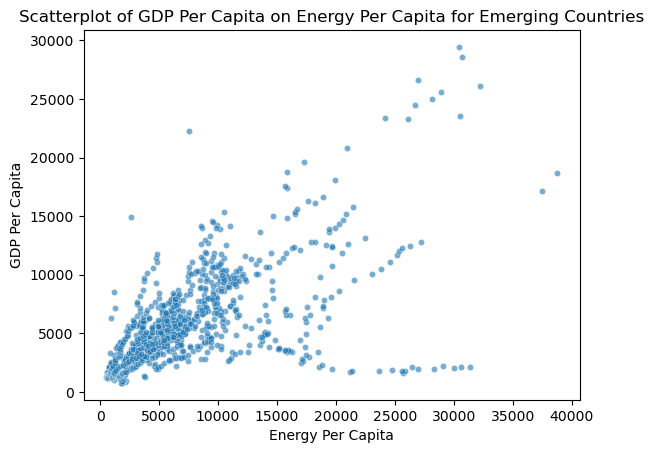

In [42]:
#plot the actual data
sns.scatterplot(x = 'energy_per_capita', y = 'gdp_per_capita', data = emerging_countries_all, s=20, alpha=0.6)
plt.xlabel('Energy Per Capita'); plt.ylabel('GDP Per Capita')
plt.title("Scatterplot of GDP Per Capita on Energy Per Capita for Emerging Countries")
plt.show()

There is a set of outliers with large values for Energy per Capita, but small values for GDP per Capita.  I'll investigate this.

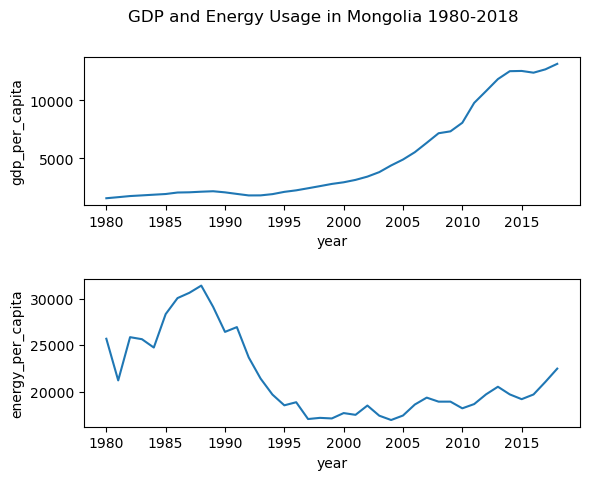

In [43]:
outlier_df = emerging_countries_all[(emerging_countries_all['energy_per_capita'] > 20000) & (emerging_countries_all['gdp_per_capita'] < 5000)] 
# Mongolia is the outlier
mongolia_df = emerging_countries_all[emerging_countries_all['country'] == "Mongolia"]

fig, axs = plt.subplots(2)
sns.lineplot(x = 'year', y = 'gdp_per_capita', data = mongolia_df, ax = axs[0])
plt.suptitle("GDP and Energy Usage in Mongolia 1980-2018")

plt.subplots_adjust( hspace=0.5)
sns.lineplot(x = 'year', y = 'energy_per_capita', data = mongolia_df, ax = axs[1])
plt.show()

In Mongolia, gdp and energy do not appear to have a relationship.  This is a stark example of other things influencing gdp and is an important reminder that energy usage is not the only thing that influences gdp.  As can be seen in the below graph though, Mongolia was the only major outlying country.  This means that in most poor nations, GDP and energy usage have a strong positive relationship.

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:         gdp_per_capita   R-squared:                       0.596
Model:                            OLS   Adj. R-squared:                  0.596
Method:                 Least Squares   F-statistic:                     1380.
Date:                Mon, 29 May 2023   Prob (F-statistic):          3.05e-186
Time:                        11:34:39   Log-Likelihood:                -8667.2
No. Observations:                 936   AIC:                         1.734e+04
Df Residuals:                     934   BIC:                         1.735e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
=====================================================================================
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
Intercept          1966.6944    133.441     14.738      0.000    1704.816    2228.573
energy_per_capita     0.5768      0.016     37.154      0.000       0.546       0.607
==============================================================================
Omnibus:                      125.509   Durbin-Watson:                   0.265
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              488.222
Skew:                           0.584   Prob(JB):                    9.64e-107
Kurtosis:                       6.340   Cond. No.                     1.38e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.38e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

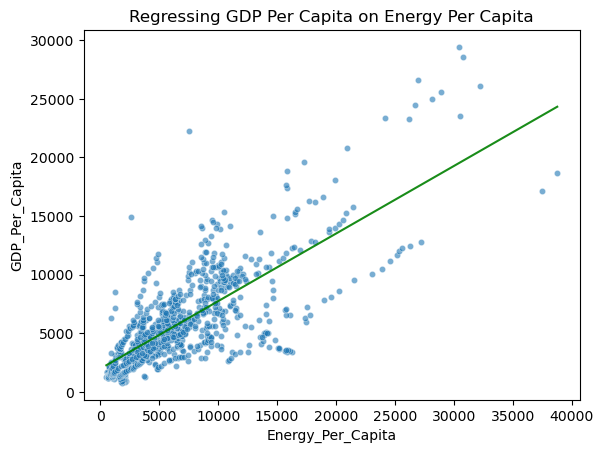

In [44]:
# Fitting a model excluding Mongolia
emerging_countries_not_mongolia = emerging_countries_all[~emerging_countries_all['country'].isin(['Mongolia'])]

# Generate the x-axis values for predicting the dependent variable
x = pd.DataFrame({'energy_per_capita': np.linspace(emerging_countries_not_mongolia.energy_per_capita.min(), emerging_countries_not_mongolia.energy_per_capita.max(), len(emerging_countries_not_mongolia.energy_per_capita))})

#generate the the regression model
mod = smf.ols(formula = 'gdp_per_capita ~ energy_per_capita', data = emerging_countries_not_mongolia).fit()

#plot the actual data
sns.scatterplot(x = 'energy_per_capita', y = 'gdp_per_capita', data = emerging_countries_not_mongolia, s=20, alpha=0.6)
plt.xlabel('Energy_Per_Capita'); plt.ylabel('GDP_Per_Capita')
plt.title("Regressing GDP Per Capita on Energy Per Capita")

#render the regression line by predicting the ys using the generated model from above
plt.plot(x.energy_per_capita, mod.predict(x), 'g-', alpha=0.9)

display(mod.summary())

The omnibus and Jarque-Bera tests show that the residuals are not normally distributed and the Durbin-Watson test shows that there is autocorrelation between the energy values meaning that the energy values depend on each other.  This makes sense as this is time series data.  There are a few outliers, and the variance about the regression line is pretty equal, except for small values of energy per capita, where the variance is less. This means that this model is flawed and won't make good predictions.  Nevertheless, the coefficient is significant, meaning that this model does show that overall there has been a strong positive relationship between energy usage per capita and gdp per capita throughout most of the poorer countries that have grown substantially richer since 1980.  An increasing GDP shows that a country is decreasing poverty and therefore the death due to starvation and disease that poverty brings.  I believe that in the future, increasing energy usage will continue to play a major role in increasing the GDP of poor countries and therefore making the lives of their people better.

##### Exporting data for Tableau

In [45]:
df_TopAndEmerging = pd.concat([emerging_countries_not_mongolia, df_Top_Countries], axis = 0, ignore_index = True)

In [47]:
df_TopAndEmerging.to_csv('./Datasets/GDPandEnergy.csv', index = False)

### 6. Conclusion <a name="model-summary"></a>

CO2 emissions are rising, except for Germany, where they're decreasing due to their commitment to fulfil all its electricity needs with supplies from renewable sources by 2035 To combat global warming, we must promote renewable energy and sustainable land-use. This can reduce CO2 emissions and mitigate climate change impacts.

Projections show that the share of renewable energy in the world's 10 largest economies is expected to gradually increase in the coming decades.
However, unless there is a stronger commitment by the largest and leading economies to transition to renewable energy, it is unlikely that we will meet the carbon neutrality goal by 2050.
Largest economies should be not only be aiming to reach the target but also compensate for both developing and underdeveloped countries.

It was shown that rich countries with larger economies are better able to reach the carbon neutrality goal when some of the richer countries managed to increase their GDP while also decreasing their energy usage.  It was also shown that increasing energy usage almost always has a powerful effect on increasing the GDP of a poor country.  In poor countries, I think that decreasing poverty, by increasing a country's GDP, is much more important than the carbon neutrality goal.  Not only that, I think that the people of poor countries, who are living in poverty, do not even care about a carbon neutrality goal when they have very important present issues such as death by starvation or disease.   Because of this, poor countries should be encouraged to increase their energy usage in order to increase their GDP which will help to bring the country out of poverty.